In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Importing all necessary libraries

In [ ]:
import time
import os
import itertools
import numpy as np
import copy
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import random_split
import seaborn as sns
from torchvision import models
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, roc_auc_score, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
from torchsummary import summary
import cv2
import warnings


warnings.filterwarnings("ignore")

### 1. Data preparation

Downloading and preparing dataset

In [ ]:
# Визначення послідовності операцій трансформації для підготовки даних
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Lambda(lambda img: img.convert('RGB')),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Нормалізація даних
])

from torchvision import datasets

dataset = datasets.Caltech101(root='/content/drive/MyDrive/data', download=True, transform=transform)

# Розбиття датасету на тренувальну і валідаційну частини
train_dataset, val_dataset = random_split(dataset, (int(0.8 * len(dataset)), len(dataset) - int(0.8 * len(dataset))))

# Створення DataLoader для тренувальної та валідаційної частин датасету
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)

Using downloaded and verified file: /content/drive/MyDrive/data/caltech101/101_ObjectCategories.tar.gz
Extracting /content/drive/MyDrive/data/caltech101/101_ObjectCategories.tar.gz to /content/drive/MyDrive/data/caltech101
Using downloaded and verified file: /content/drive/MyDrive/data/caltech101/Annotations.tar
Extracting /content/drive/MyDrive/data/caltech101/Annotations.tar to /content/drive/MyDrive/data/caltech101


# **Plain 3-layer CNN**

In [ ]:
class PlainCNN(nn.Module):
    def __init__(self, num_classes: int) -> None:
        super(PlainCNN, self).__init__()
        # Визначення згорткових шарів
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),  # 3 вхідних канали, 32 вихідні канали, ядро 3x3
            nn.ReLU(),  # Функція активації ReLU
            nn.MaxPool2d(kernel_size=2, stride=2),  # Максимальне згортання з ядром 2x2
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),  # 32 вхідних канали, 64 вихідні канали, ядро 3x3
            nn.ReLU(),  # Функція активації ReLU
            nn.MaxPool2d(kernel_size=2, stride=2),  # Максимальне згортання з ядром 2x2
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),  # 64 вхідних канали, 64 вихідні канали, ядро 3x3
            nn.ReLU(),  # Функція активації ReLU
            nn.MaxPool2d(kernel_size=2, stride=2),  # Максимальне згортання з ядром 2x2
        )
        # Шар для згорткового перетворення тензора з тривимірного у одновимірний
        self.flatten = nn.Flatten()
        # Визначення Fully connected шарів
        self.fc_layers = nn.Sequential(
            nn.Linear(64 * 28 * 28, 128),  # Fully connected шар з 64*28*28 вхідними ознаками та 128 вихідними ознаками
            nn.ReLU(),  # Функція активації ReLU
            nn.Linear(128, num_classes),  # Fully connected шар з 128 вхідними ознаками та num_classes вихідними ознаками
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv_layers(x)  # Прямий прохід через згорткові шари
        x = self.flatten(x)  # Перетворення вихідного тензора у одновимірний
        x = self.fc_layers(x)  # Прямий прохід через повнозв'язані шари
        return x


# Вибір пристрою для навчання (CUDA, якщо доступно)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cnn = PlainCNN(101).to(device)
# Виведення структури моделі
summary(cnn, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             896
              ReLU-2         [-1, 32, 224, 224]               0
         MaxPool2d-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 64, 112, 112]          18,496
              ReLU-5         [-1, 64, 112, 112]               0
         MaxPool2d-6           [-1, 64, 56, 56]               0
            Conv2d-7           [-1, 64, 56, 56]          36,928
              ReLU-8           [-1, 64, 56, 56]               0
         MaxPool2d-9           [-1, 64, 28, 28]               0
          Flatten-10                [-1, 50176]               0
           Linear-11                  [-1, 128]       6,422,656
             ReLU-12                  [-1, 128]               0
           Linear-13                  [-1, 101]          13,029
Total params: 6,492,005
Trainable param

# **Frozen pre-trained ResNet as feature extractor**

In [ ]:
class ResNetFrozen(nn.Module):
    def __init__(self, num_classes: int) -> None:
        super(ResNetFrozen, self).__init__()
        # Завантажуємо попередньо навчену модель ResNet101
        self.resnet = models.resnet101(pretrained=True)
        # Заморожуємо параметри
        for param in self.resnet.parameters():
            param.requires_grad = False
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)

    def forward(self, x):
        x = self.resnet(x)
        return x


res_net_frozen = ResNetFrozen(101).to(device)
# Виведення структури моделі
summary(res_net_frozen, input_size=(3, 224, 224))


Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 151MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

# **Fine-tuned pre-trained ResNet**

In [ ]:
class FineTunedResNet(nn.Module):
    def __init__(self, num_classes: int, percent_of_layers_to_be_trained: float) -> None:
        super(FineTunedResNet, self).__init__()
        self.resnet = models.resnet101(pretrained=True)  # Завантаження попередньо навченої ResNet-101

        amount_of_layers = len(list(self.resnet.parameters()))  # Загальна кількість шарів у моделі
        num_layers_to_freeze = int(amount_of_layers * percent_of_layers_to_be_trained)  # Кількість шарів, які будуть заморожені

        # Замороження вказаної частини параметрів моделі
        for param in list(self.resnet.parameters())[:-num_layers_to_freeze]:
            param.requires_grad = False

        # Заміна останнього fully connected шару на новий з відповідною кількістю класів
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, num_classes)

    def forward(self, x):
        return self.resnet(x)


fine_resnet = FineTunedResNet(101, 0.2).to(device)
# Виведення структури моделі
summary(fine_resnet, input_size=(3, 224, 224))



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

Defining function for fitting (training) model :

In [ ]:
from typing import Tuple, List


def train(model: nn.Module, optimizer: optim.Optimizer,
          train_loader: torch.utils.data.DataLoader, val_loader: torch.utils.data.DataLoader,
          epochs: int, device: torch.device) -> Tuple[List[float], List[float], List[float], List[float], List[int], List[int], List[float]]:
    #Функція втрат для задач класифікації
    criterion = nn.CrossEntropyLoss()
    train_loss = 0.0
    train_acc = 0.0
    val_acc = 0
    val_losses = []
    train_losses = []
    test_predictions = []
    test_labels = []
    test_probabilities = []
    train_accs = []
    val_accs = []

    for epoch in range(epochs):
        model.train()  # Перемикаємо модель у режим тренування
        for i, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()  # Обнуляємо градієнти
            outputs = model(images)
            loss = criterion(outputs, labels)  # Обчислюємо втрати

            loss.backward()  # Обчислюємо градієнти
            optimizer.step()  # Оновлюємо параметри моделі
            train_loss += loss.item()  # Додаємо втрати

            _, predicted = torch.max(outputs.data, 1)  # Отримуємо передбачення
            train_acc += (predicted == labels).sum().item()  # Рахуємо точність

        train_loss /= len(train_loader.dataset)
        train_losses.append(train_loss)
        train_acc /= len(train_loader.dataset)
        train_accs.append(train_acc)

        model.eval()  # Перемикаємо модель у режим перевірки
        val_loss = 0.0
        with torch.no_grad():
            for i, (images, labels) in enumerate(val_loader):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                _, predicted = torch.max(outputs.data, 1)

                val_acc += (predicted == labels).sum().item()
                val_loss += loss.item()

                test_predictions.extend(predicted.tolist())
                test_labels.extend(labels.tolist())
                test_probabilities.extend(F.softmax(outputs, dim=1).cpu().numpy().tolist())

            val_loss /= len(val_loader.dataset)
            val_acc /= len(val_loader.dataset)
            val_losses.append(val_loss)
            val_accs.append(val_acc)

        print('Epoch [{}/{}], Train Loss: {:.4f}, Train Acc: {:.2f}%, Val Loss: {:.4f}, Val Acc: {:.2f}%'
              .format(epoch+1, epochs, train_loss, train_acc*100, val_loss, val_acc*100))

    return train_losses, val_losses, train_accs, val_accs, test_labels, test_predictions, test_probabilities


The predict function takes a trained model and a dataloader to make predictions for a given dataset.

In [ ]:
def predict(model, dataloader, device):
    y_true = []
    y_pred = []
    confidence = []

    size = len(dataloader.dataset)  # Кількість прикладів у датасеті

    model.eval()  # Встановлення моделі у режимі оцінки
    with torch.no_grad():
        for batch, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)  # Переміщення вхідних даних на пристрій
            labels = labels.to(device)  # Переміщення міток на пристрій
            outputs = model(inputs)  # Отримання виходів моделі
            _, preds = torch.max(outputs, 1)  # Отримання передбачень моделі

            y_true.append(labels.cpu().numpy())
            y_pred.append(preds.cpu().numpy())

            # Обчислення впевненості моделі
            outputs = F.softmax(outputs, dim=1)
            max_v, _ = outputs.max(1)
            confidence.append(max_v.cpu().numpy())

            if batch % 10 == 0:
                current = batch * dataloader.batch_size
                print(f'[Крок ({current}/{size}])')
        print(f'[Крок ({size}/{size}])')

    # Конвертація списків у numpy масиви
    y_true = np.concatenate([v.squeeze() for v in y_true])
    y_pred = np.concatenate([v.squeeze() for v in y_pred])
    confidence = np.concatenate([v.squeeze() for v in confidence])

    return y_true, y_pred, confidence

In [ ]:
models = [cnn, res_net_frozen, fine_resnet]  # Список моделей для навчання
epohs_list = [10, 10, 5]

train_report = []  # Звіт про навчання моделей

# Цикл для навчання кожної моделі
for i, model in enumerate(models):
    print(f'Train mode {i + 1}')
    opt = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)  # Оптимізатор Stochastic Gradient Descent
    # Навчання моделі і отримання метрик
    train_losses_res, val_losses_res, train_acc_res, val_acc_res, test_labels_res, test_preds_res, test_probs_res = train(model, opt, train_loader, val_loader, epohs_list[i], device)

    train_report.append((train_losses_res, val_losses_res, train_acc_res, val_acc_res, test_labels_res, test_preds_res, test_probs_res))

    # Збереження моделі
    torch.save(model.state_dict(), f"Model_{i + 1}.pth")


Train mode 1
Epoch [1/10], Train Loss: 0.1050, Train Acc: 29.84%, Val Loss: 0.0854, Val Acc: 41.94%
Epoch [2/10], Train Loss: 0.0751, Train Acc: 45.85%, Val Loss: 0.0740, Val Acc: 49.10%
Epoch [3/10], Train Loss: 0.0533, Train Acc: 58.64%, Val Loss: 0.0745, Val Acc: 48.93%
Epoch [4/10], Train Loss: 0.0340, Train Acc: 71.77%, Val Loss: 0.0743, Val Acc: 51.07%
Epoch [5/10], Train Loss: 0.0182, Train Acc: 84.32%, Val Loss: 0.0904, Val Acc: 52.22%
Epoch [6/10], Train Loss: 0.0100, Train Acc: 91.17%, Val Loss: 0.1030, Val Acc: 53.66%
Epoch [7/10], Train Loss: 0.0069, Train Acc: 94.24%, Val Loss: 0.1066, Val Acc: 52.62%
Epoch [8/10], Train Loss: 0.0046, Train Acc: 95.89%, Val Loss: 0.1304, Val Acc: 52.51%
Epoch [9/10], Train Loss: 0.0046, Train Acc: 95.78%, Val Loss: 0.1246, Val Acc: 53.60%
Epoch [10/10], Train Loss: 0.0029, Train Acc: 97.19%, Val Loss: 0.1291, Val Acc: 53.66%
Train mode 2
Epoch [1/10], Train Loss: 0.0353, Train Acc: 76.96%, Val Loss: 0.0112, Val Acc: 90.90%
Epoch [2/10], Tr

In [ ]:
# My CNN
print('Predicting my CNN')
my_cnn_pred, my_cnn_true, my_cnn_confidence = predict(cnn, val_loader, device)

# Frozen resnet
print('Predicting frozen ResNet')
frozen_resnet_pred, frozen_resnet_true, frozen_resnet_confidence = predict(res_net_frozen, val_loader, device)

# Fine-tuned resnet
print('Predicting fine-tuned ResNet')
fine_resnet_pred, fine_resnet_true, fine_resnet_confidence = predict(fine_resnet, val_loader, device)

Predicting my CNN
[Крок (0/1736])
[Крок (320/1736])
[Крок (640/1736])
[Крок (960/1736])
[Крок (1280/1736])
[Крок (1600/1736])
[Крок (1736/1736])
Predicting frozen ResNet
[Крок (0/1736])
[Крок (320/1736])
[Крок (640/1736])
[Крок (960/1736])
[Крок (1280/1736])
[Крок (1600/1736])
[Крок (1736/1736])
Predicting fine-tuned ResNet
[Крок (0/1736])
[Крок (320/1736])
[Крок (640/1736])
[Крок (960/1736])
[Крок (1280/1736])
[Крок (1600/1736])
[Крок (1736/1736])


### 3. Attaching training / validation results :

**3.1** Classification report :

Classification report for 3-layer CNN :

In [ ]:
print('My CNN classification report:')
print(classification_report(my_cnn_pred, my_cnn_true, target_names=dataset.categories))

My CNN classification report:
                 precision    recall  f1-score   support

          Faces       0.83      0.85      0.84        93
     Faces_easy       0.84      0.97      0.90        89
       Leopards       0.98      0.96      0.97        50
     Motorbikes       0.95      0.99      0.97       153
      accordion       0.43      0.33      0.38         9
      airplanes       0.88      0.97      0.92       161
         anchor       0.00      0.00      0.00         8
            ant       0.14      0.14      0.14         7
         barrel       0.00      0.00      0.00        12
           bass       0.00      0.00      0.00        12
         beaver       0.11      0.29      0.16         7
      binocular       0.40      0.22      0.29         9
         bonsai       0.46      0.39      0.42        28
          brain       0.37      0.45      0.41        22
   brontosaurus       0.00      0.00      0.00         8
         buddha       0.43      0.30      0.35        20


Classification report for frozen pre-trained ResNet101:

In [ ]:
print('Frozen ResNet classification report:')
print(classification_report(frozen_resnet_pred, frozen_resnet_true, target_names=dataset.categories))

Frozen ResNet classification report:
                 precision    recall  f1-score   support

          Faces       0.99      0.99      0.99        93
     Faces_easy       0.99      0.99      0.99        89
       Leopards       1.00      1.00      1.00        50
     Motorbikes       0.99      1.00      1.00       153
      accordion       1.00      1.00      1.00         9
      airplanes       0.99      0.99      0.99       161
         anchor       0.62      0.62      0.62         8
            ant       0.86      0.86      0.86         7
         barrel       1.00      0.92      0.96        12
           bass       0.91      0.83      0.87        12
         beaver       0.88      1.00      0.93         7
      binocular       1.00      1.00      1.00         9
         bonsai       1.00      0.96      0.98        28
          brain       1.00      0.95      0.98        22
   brontosaurus       0.89      1.00      0.94         8
         buddha       1.00      1.00      1.00    

Classification report for fine-tuned pre-trained ResNet101:

In [ ]:
print('Fine-tuned ResNet classification report:')
print(classification_report(fine_resnet_pred, fine_resnet_true, target_names=dataset.categories))

Fine-tuned ResNet classification report:
                 precision    recall  f1-score   support

          Faces       0.99      0.99      0.99        93
     Faces_easy       0.99      0.99      0.99        89
       Leopards       1.00      1.00      1.00        50
     Motorbikes       1.00      1.00      1.00       153
      accordion       1.00      1.00      1.00         9
      airplanes       1.00      0.99      1.00       161
         anchor       0.89      1.00      0.94         8
            ant       0.67      0.86      0.75         7
         barrel       1.00      1.00      1.00        12
           bass       1.00      0.75      0.86        12
         beaver       1.00      0.86      0.92         7
      binocular       1.00      1.00      1.00         9
         bonsai       1.00      0.96      0.98        28
          brain       1.00      1.00      1.00        22
   brontosaurus       1.00      1.00      1.00         8
         buddha       1.00      1.00      1.00

**3.2** 101 x 101 confusion matrices :


(PS: Class numbering from 0)



Defining function for plotting matrix :

In [ ]:
def confusion_matrices(test_labels_true, test_preds):
    test_labels = np.array(test_labels_true)
    test_predictionss = np.array(test_preds)

    matrix = confusion_matrix(test_labels, test_predictionss)

    plt.figure(figsize=(40, 40))
    sns.heatmap(matrix, annot=True, cmap='Reds', fmt='g', xticklabels=range(101), yticklabels=range(101))
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted values')
    plt.ylabel('Actual values')
    plt.show()

101 x 101 confusion matrix for 3-layer CNN :

My CNN confusion matrix


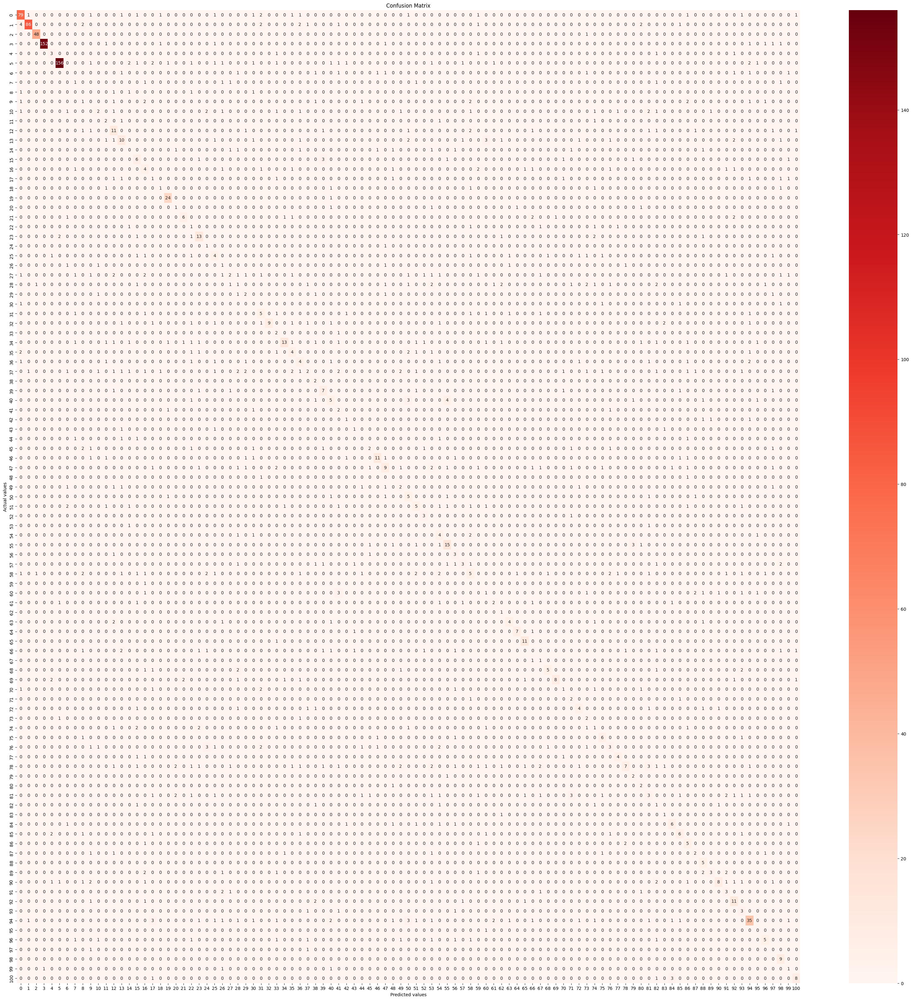

In [ ]:
print('My CNN confusion matrix')
confusion_matrices(my_cnn_true, my_cnn_pred)

101 x 101 confusion matrix for frozen pre-trained ResNet101:

Frozen ResNet confusion matrix


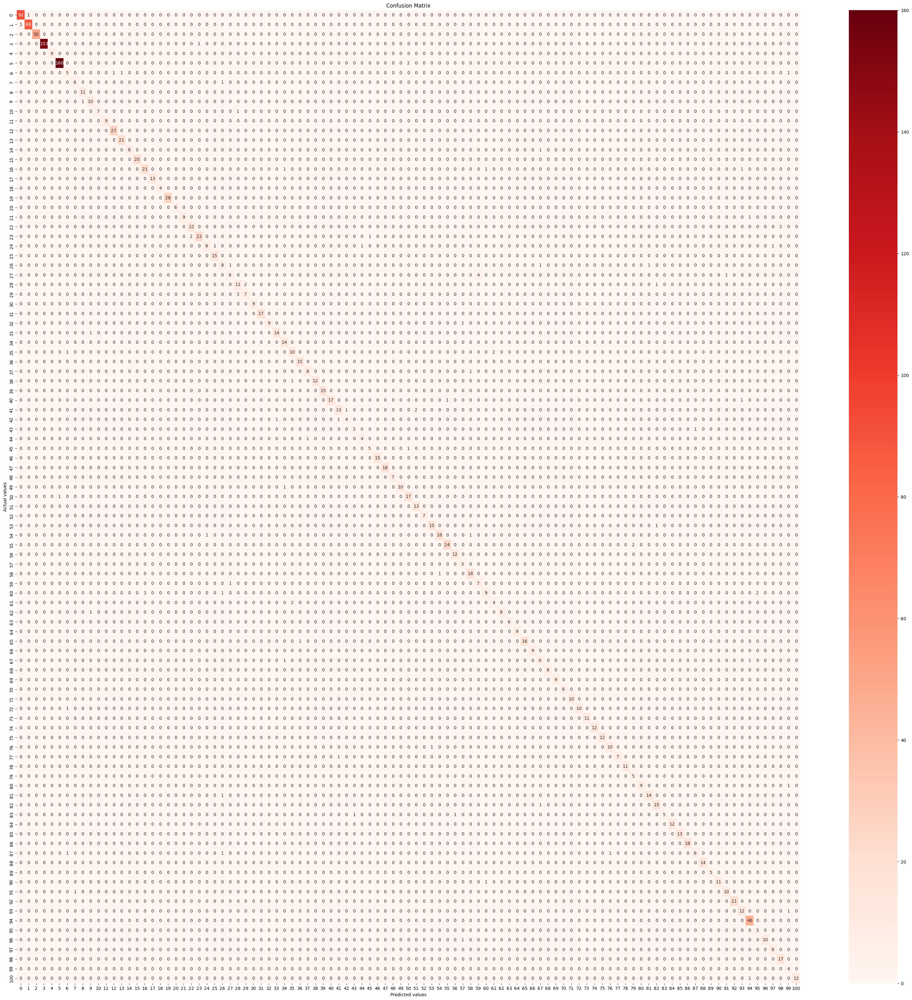

In [ ]:
print('Frozen ResNet confusion matrix')
confusion_matrices(frozen_resnet_true, frozen_resnet_pred)

101 x 101 confusion matrix for fine-tuned pre-trained ResNet101:

Fine-tuned ResNet confusion matrix


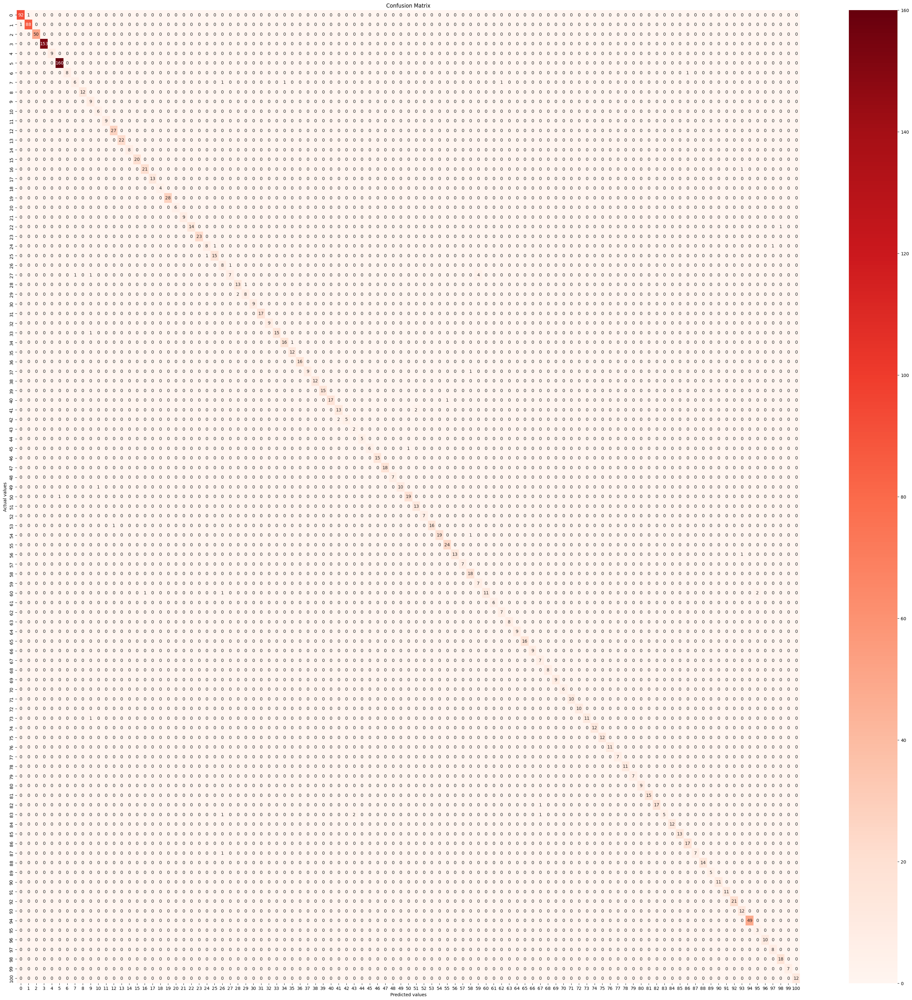

In [ ]:
print('Fine-tuned ResNet confusion matrix')
confusion_matrices(fine_resnet_true, fine_resnet_pred)

**3.3** Learning curves plot :

Defining function for plotting Learning curves:

In [ ]:
def plot_learning_curves(train_report: list, name: str):
    train_losses, val_losses, train_acc, val_acc, _, _, _ = train_report

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label=f'Model {i + 1} Train')
    plt.plot(val_losses, label=f'Model {i + 1} Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Model {name} Losses')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(train_acc, label=f'Model {i + 1} Train')
    plt.plot(val_acc, label=f'Model {i + 1} Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Model {name} Accuracies')
    plt.legend()

    plt.tight_layout()
    plt.show()

Learning curves for 3-layer CNN :

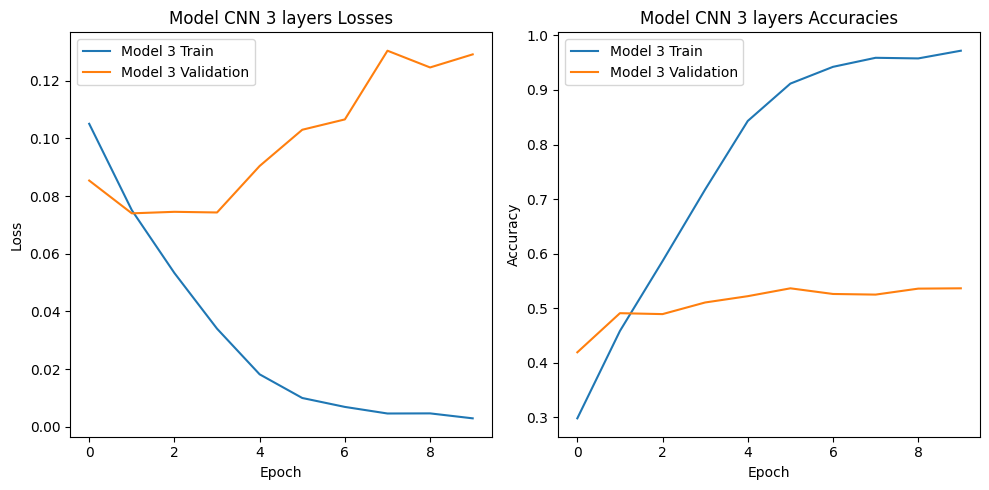

In [ ]:
plot_learning_curves(train_report[0], 'CNN 3 layers')

Learning curves for frozen pre-trained ResNet101:

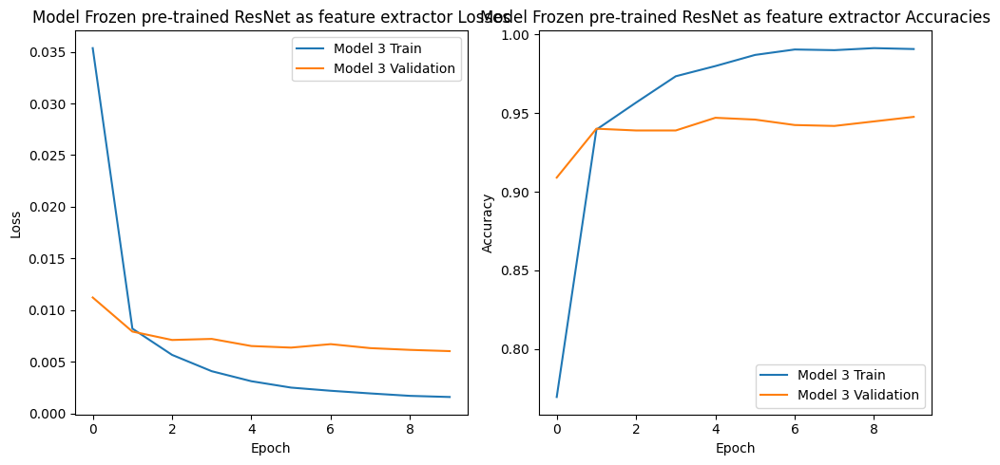

In [ ]:
plot_learning_curves(train_report[1], 'Frozen pre-trained ResNet as feature extractor')

Learning curves for fine-tuned pre-trained ResNet101:

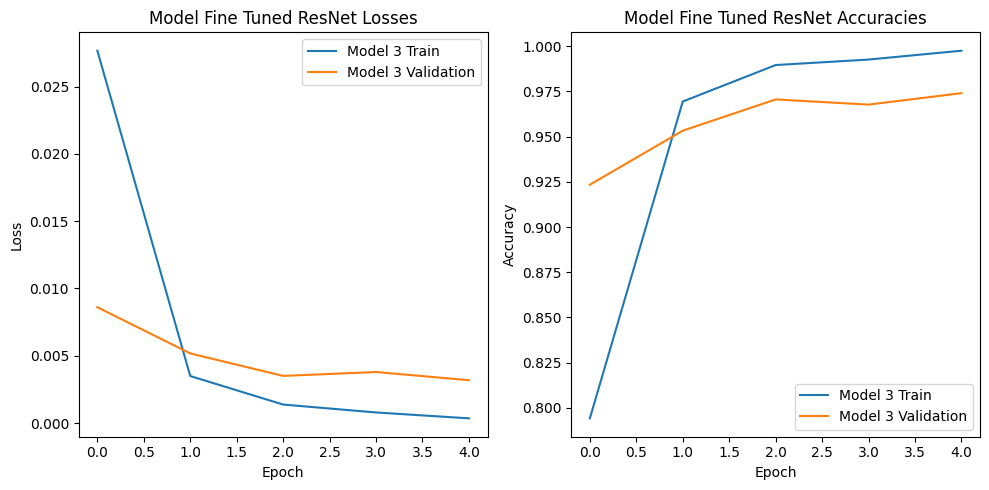

In [ ]:
plot_learning_curves(train_report[2], 'Fine Tuned ResNet')

**3.4** ROC curve plot :

Defining function for plotting ROC curve :

In [ ]:
def roc_curve_plot(test_labels, test_probabilities):
    n_classes = len(np.unique(test_labels))
    test_labels = np.array(test_labels)
    test_probabilities = np.array(test_probabilities)

    num_rows = (n_classes + 4) // 5
    num_cols = min(n_classes, 5)
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 8*num_rows))

    for i, ax in enumerate(axs.flat):
        if i < n_classes:
            fpr, tpr, _ = roc_curve(test_labels == i, test_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            ax.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.2f})')
            ax.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f'ROC - Class {i}')
            ax.legend(loc="lower right")
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

ROC curve for 3-layer CNN :

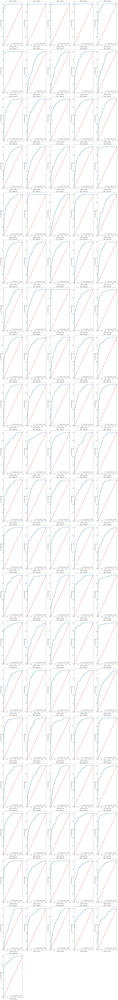

In [ ]:
roc_curve_plot(train_report[0][-3], train_report[0][-1])

ROC curve for frozen pre-trained ResNet101:

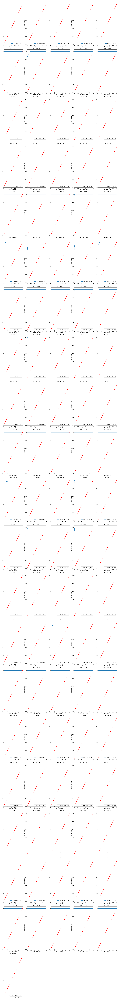

In [ ]:
roc_curve_plot(train_report[1][-3], train_report[1][-1])

ROC curve for fine-tuned pre-trained ResNet101:

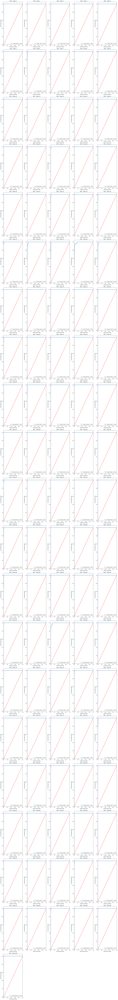

In [ ]:
roc_curve_plot(train_report[2][-3], train_report[2][-1])

**3.5** AUC - PRC plot :

Defining function for plotting PRC curve :

In [ ]:
def auc_prc(test_labels, test_probabilities):
    n_classes = len(np.unique(test_labels))
    test_labels = np.array(test_labels)
    test_probabilities = np.array(test_probabilities)

    test_labels_onehot = np.zeros((len(test_labels), n_classes))
    test_labels_onehot[np.arange(len(test_labels)), test_labels] = 1
    precision, recall, average_precision = [], [], []

    num_rows = (n_classes + 4) // 5
    num_cols = min(n_classes, 5)
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 8*num_rows))

    for i, ax in enumerate(axs.flat):
        if i < n_classes:
            p, r, _ = precision_recall_curve(test_labels_onehot[:, i], test_probabilities[:, i])
            precision.append(p)
            recall.append(r)
            average_precision.append(auc(r, p))
            ax.plot(r, p, label=f'Class {i}, AUC: {average_precision[i]:.2f}')
            ax.set_xlabel('Recall')
            ax.set_ylabel('Precision')
            ax.set_ylim([0.0, 1.05])
            ax.set_xlim([0.0, 1.0])
            ax.set_title(f'AUC-PRC - Class {i}')
            ax.legend(loc="lower left")
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay


def micro_averaged(pred_y, true_y, confidence):
    precision = dict()
    recall = dict()
    average_precision = dict()

    correct_prediction = pred_y == true_y

    i = -1
    while (i := i + 1) < 101:
        class_indices = np.nonzero(true_y == i)[0]

        if len(class_indices) == 0:
            continue

        precision[i], recall[i], _ = precision_recall_curve(correct_prediction[class_indices],
                                                            confidence[class_indices])
        average_precision[i] = average_precision_score(correct_prediction[class_indices], confidence[class_indices])

    precision['micro'], recall['micro'], _ = precision_recall_curve(
        correct_prediction, confidence
    )
    average_precision['micro'] = average_precision_score(correct_prediction, confidence, average='micro')

    display = PrecisionRecallDisplay(
        recall=recall['micro'],
        precision=precision['micro'],
        average_precision=average_precision['micro'],
    )
    display.plot()
    display.ax_.set_title('Micro-averaged Precision-Recall ')

PRC curve for 3-layer CNN :

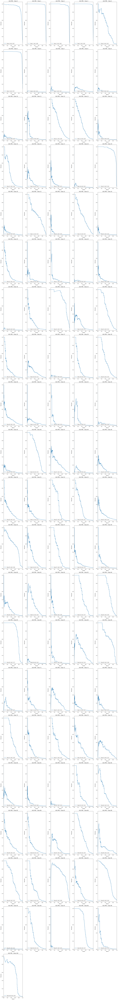

In [ ]:
auc_prc(train_report[0][-3], train_report[0][-1])

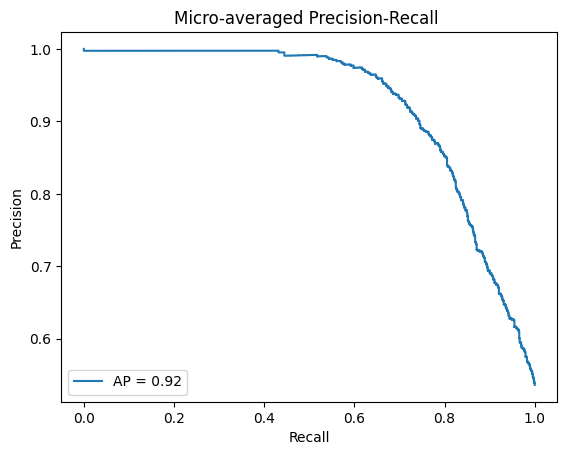

In [ ]:
micro_averaged(my_cnn_pred, my_cnn_true, my_cnn_confidence)

PRC curve for frozen pre-trained ResNet101:

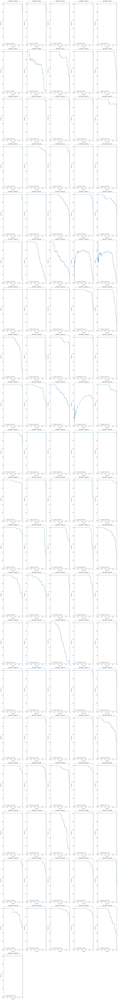

In [ ]:
auc_prc(train_report[1][-3], train_report[1][-1])

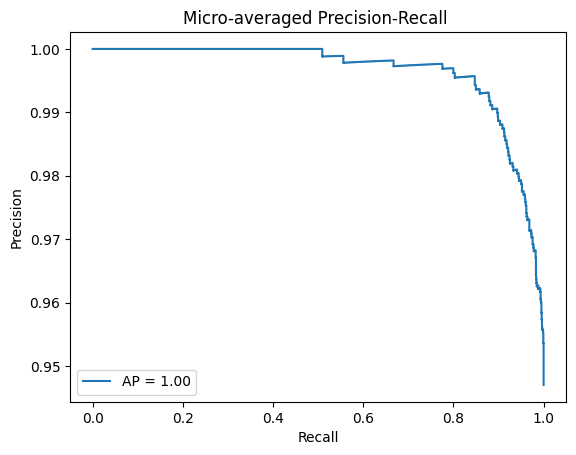

In [ ]:
micro_averaged(frozen_resnet_pred, frozen_resnet_true, frozen_resnet_confidence)

PRC curve for fine-tuned pre-trained ResNet101:

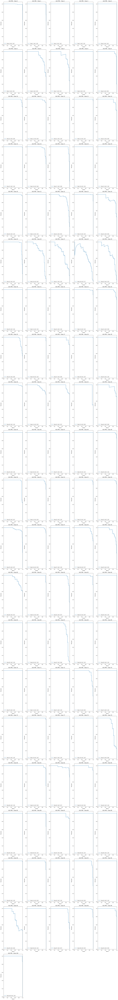

In [ ]:
auc_prc(train_report[2][-3], train_report[2][-1])

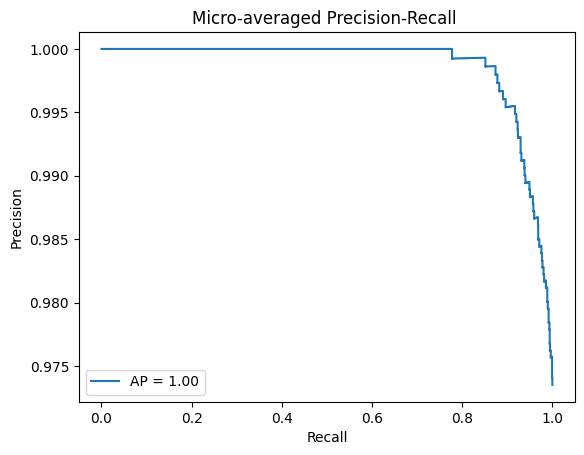

In [ ]:
micro_averaged(fine_resnet_pred, fine_resnet_true, fine_resnet_confidence)

**3.6** The top-1 error rate in % :

Average accuracy for all models

In [ ]:
print(f'Average accuracy for CNN 3 layers: {train_report[0][3][-1] * 100} %')

Average accuracy for CNN 3 layers: 53.659908798787725 %


In [ ]:
print(f'Average accuracy for Frozen pre-trained ResNet as feature extractor: {train_report[1][3][-1] * 100} %')

Average accuracy for Frozen pre-trained ResNet as feature extractor: 94.75487712719122 %


In [ ]:
print(f'Average accuracy for Fine-tuned pre-trained ResNet: {train_report[2][3][-1] * 100} %')

Average accuracy for Fine-tuned pre-trained ResNet: 97.4059749422376 %


In [ ]:
def accuracy(output, target, topk=(1,)):
    """Computes the precision@k for the specified values of k"""
    maxk = max(topk)
    batch_size = target.size(0)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].reshape(-1).float().sum(0)
        res.append(correct_k.mul_(100.0 / batch_size))
    return res


def get_top_1_error_rate(model, dataloader, device):
    top1 = []
    top5 = []

    size = len(dataloader.dataset)  # Кількість прикладів у датасеті
    model.eval()  # Встановлення моделі у режимі оцінки
    with torch.no_grad():
        for batch, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)  # Переміщення вхідних даних на пристрій
            labels = labels.to(device)  # Переміщення міток на пристрій
            outputs = model(inputs)  # Отримання виходів моделі
            prec1, prec5 = accuracy(outputs, labels, topk=(1, 5))
            top1.append(prec1.cpu().numpy())
            top5.append(prec5.cpu().numpy())

    return 100 - sum(top1) / len(top1),  100 - sum(top5) / len(top5)

Top-1 and top-5 error rate CNN 3 layers

In [ ]:
print(f'{get_top_1_error_rate(models[0], val_loader, device)[0]} %;  {get_top_1_error_rate(models[0], val_loader, device)[1]} %')

46.42045454545455 %;  30.11363636363636 %


Top-1 and top-5 error rate Frozen pre-trained ResNet as feature extractor

In [ ]:
print(f'{get_top_1_error_rate(models[1], val_loader, device)[0]} %;  {get_top_1_error_rate(models[1], val_loader, device)[1]} %')

5.227272727272734 %;  0.9090909090909065 %


Top-1 and top-5 error rate Fine-tuned pre-trained ResNet

In [ ]:
print(f'{get_top_1_error_rate(models[2], val_loader, device)[0]} %;  {get_top_1_error_rate(models[2], val_loader, device)[1]} %')

2.6136363636363598 %;  0.11363636363635976 %


Тут нам вдалось досягнути Top-1 error rate < 15 та Top-5 error rate < 15.

### 4. Visualizing filters and corresponding feature maps of the first and second Conv2d layers

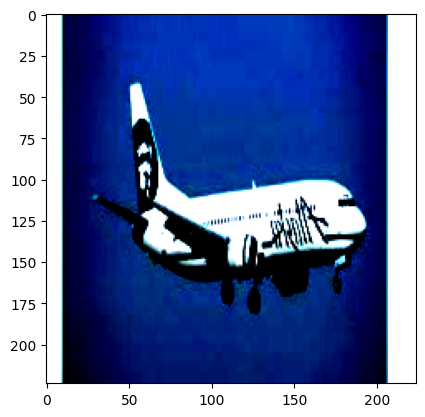

In [ ]:
cnn.eval()

# one batch of images
images, labels = next(iter(val_loader))
images = images.numpy()

# select an image by index
index = 23
img = images[index]
orig_img = np.squeeze(img)

# show image
orig_img = np.moveaxis(orig_img, 0, -1)
plt.imshow(np.asarray(orig_img))

cnn_parameters = list(cnn.parameters())

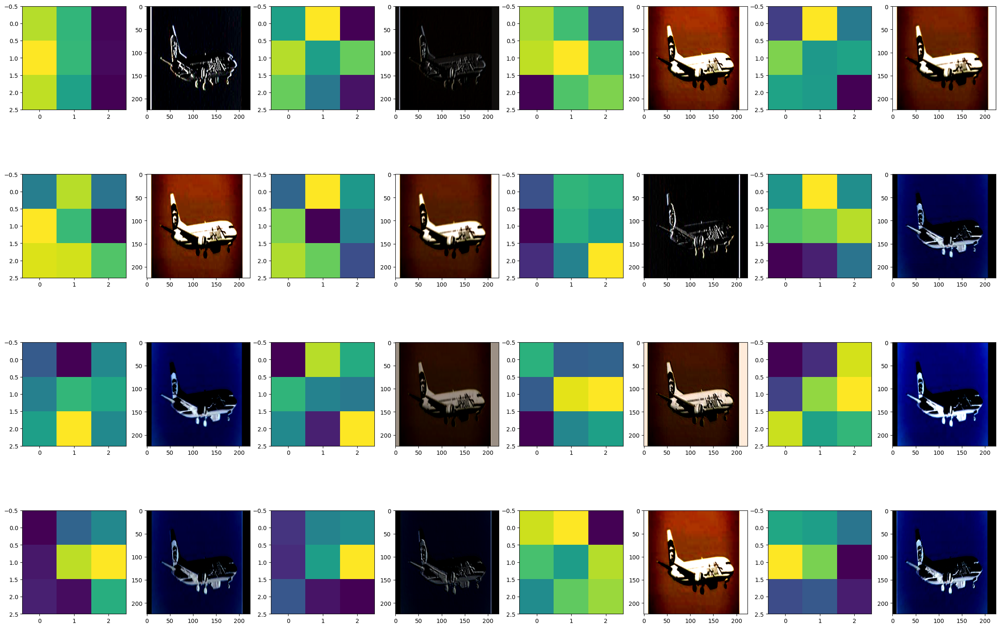

In [ ]:
# first conv layer
w = cnn_parameters[0].cpu().detach().numpy()
fig = plt.figure(figsize=(30, 20))
columns = 8
rows = len(w) // columns

for i in range(0, columns * rows):
    fig.add_subplot(rows, columns, i + 1)
    if i % 2 == 0:
        plt.imshow(w[int(i / 2)][0])
    else:
        c = cv2.filter2D(orig_img, -1, w[int((i - 1) / 2)][0])      # filter for one of colors
        plt.imshow(cv2.cvtColor(c, cv2.COLOR_BGR2RGB))
plt.show()

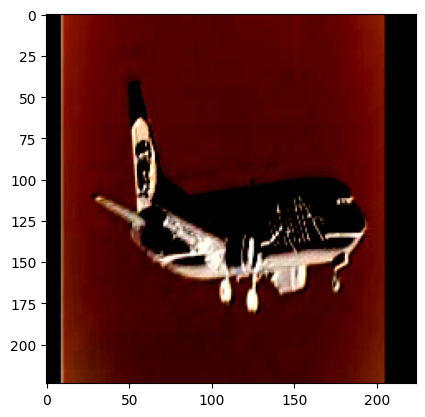

In [ ]:
curr = c
plt.imshow(curr)

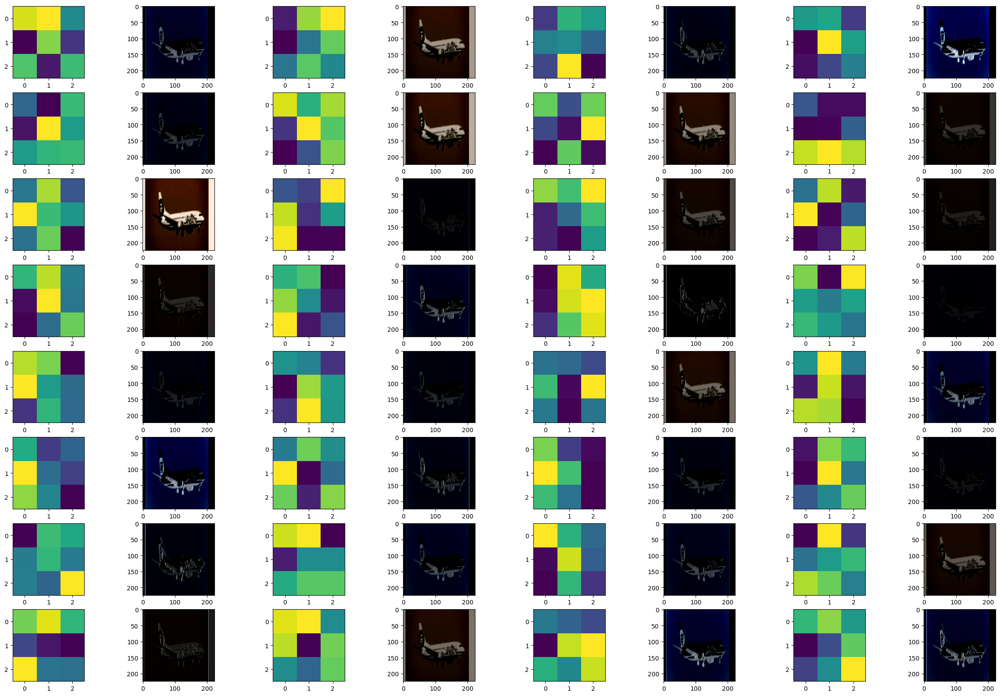

In [ ]:
# second conv layer
w = cnn_parameters[2].cpu().detach().numpy()
fig = plt.figure(figsize=(30, 20))
columns = 8
rows = len(w) // columns

for i in range(0, columns * rows):
    fig.add_subplot(rows, columns, i + 1)
    if i % 2 == 0:
        plt.imshow(w[int(i / 2)][1])
    else:
        c = cv2.filter2D(curr, -1, w[int((i - 1) / 2)][0])
        plt.imshow(cv2.cvtColor(c, cv2.COLOR_BGR2RGB))
plt.show()

1. **What kind of features did filters extract?**
Можемо поміти, що фільтри виділяють вертикальні та горизонтальні лінії, кути, градієнти кольорів, контури, але не завжди дуже точно. Це може бути пов'язано з розміров фільтра(3х3).
2. **Do you have "blind" filters that didn't learn anything? Why? How could you fix that?**
Так, на другомуо шарі є сліпі фільтри. Розмір фільтра на першому згортковому шарі 3x3, розмір вхідного зображення 224х224, але на другому шарі розмір вхідних зображень становить 112x112, розмір фільтра 3х3 і знайти щось важче. Щоб вирішити цю проблему, можна спробувати наступні дії: збільшити розмір вхідних зображень для цього шару або зменшити розмір фільтрів.
3. **Does your model consider the background of the inputs?**
Модель у більшості на даному прикладі доволі добре відокремлюють фон від об’єктів, адже фон є дуже простим(чисте небо) та помітна градація кольорів між  небом та літаком. Проте, якщо фон буде більш складним модель може не завжди коректно виділяти його та отримувати фічі з фону.
4. **Does your model consider the color of the inputs?**
Так, модель враховує колір входів. Як ми бачимо, фільтри для різних кольорів не однакові, тому вони виділяють різні характеристики для своїх кольорів. Вхідний розмір першого згорткового шару - 3, що вказує на те, що модель приймає зображення RGB із трьома кольоровими каналами.